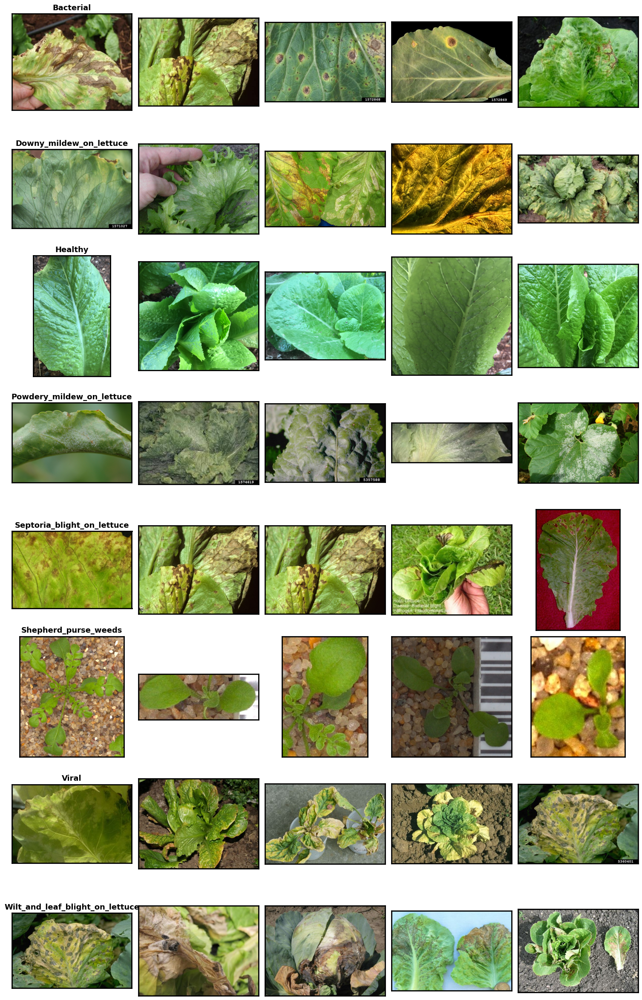

In [3]:
import os
import matplotlib.pyplot as plt
import random


def plot_class_samples(dataset_dir, n_images=5):

    class_folders = [
        d
        for d in os.listdir(dataset_dir)
        if os.path.isdir(os.path.join(dataset_dir, d))
    ]
    class_folders.sort()

    n_classes = len(class_folders)

    fig, axes = plt.subplots(n_classes, n_images, figsize=(n_images * 3, n_classes * 3))

    for row, class_name in enumerate(class_folders):

        class_path = os.path.join(dataset_dir, class_name)

        images = [
            f
            for f in os.listdir(class_path)
            if os.path.isfile(os.path.join(class_path, f))
        ]

        sample_imgs = random.sample(images, min(n_images, len(images)))

        for col in range(n_images):

            ax = axes[row, col] if n_classes > 1 else axes[col]

            ax.set_xticks([])

            ax.set_yticks([])

            # Draw border for clarity

            for spine in ax.spines.values():

                spine.set_edgecolor("black")

                spine.set_linewidth(2)

            if col < len(sample_imgs):

                img_path = os.path.join(class_path, sample_imgs[col])

                img = plt.imread(img_path)

                ax.imshow(img)

                if col == 0:

                    ax.set_title(f"{class_name}", fontsize=13, fontweight="bold")

            else:

                ax.axis("off")

    plt.tight_layout()

    plt.show()


# Example usage:
plot_class_samples(
    r"F:\Lettuce_leaf_classification\Lettuce_disease_datasets", n_images=5
)

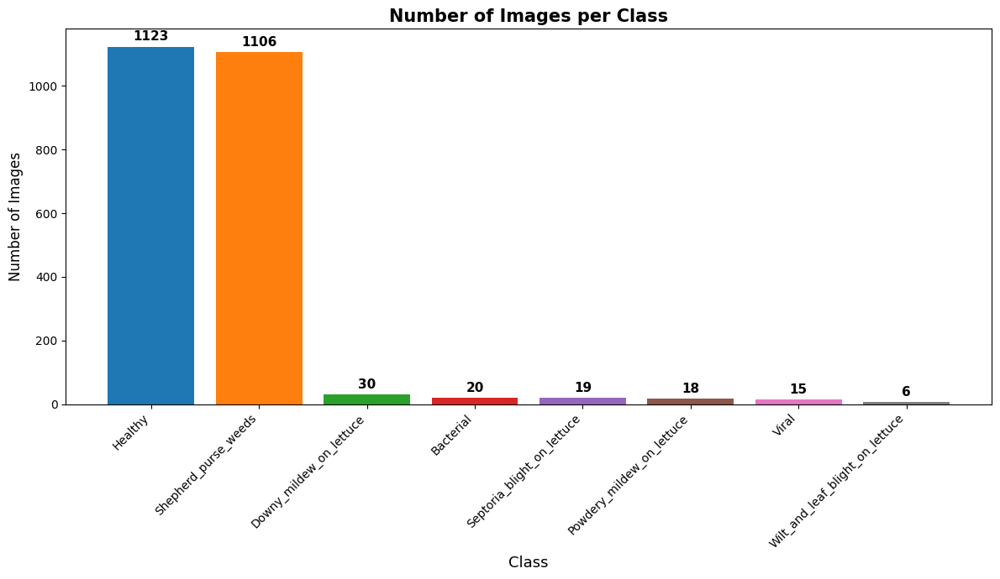

,Class,Image Count
0,Healthy,1123
1,Shepherd_purse_weeds,1106
2,Downy_mildew_on_lettuce,30
3,Bacterial,20
4,Septoria_blight_on_lettuce,19
5,Powdery_mildew_on_lettuce,18
6,Viral,15
7,Wilt_and_leaf_blight_on_lettuce,6


In [4]:
import os
import pandas as pd


import matplotlib.pyplot as plt
import seaborn as sns


from IPython.display import display, Markdown


def plot_image_counts(dataset_dir):
    """








    Visualize the number of images in each class folder as a barplot (descending order),








    and display a DataFrame with the counts. Adds count labels on bars.
    """

    class_folders = [
        d
        for d in os.listdir(dataset_dir)
        if os.path.isdir(os.path.join(dataset_dir, d))
    ]
    class_folders.sort()

    counts = []

    for class_name in class_folders:

        class_path = os.path.join(dataset_dir, class_name)
        n_images = len(
            [
                f
                for f in os.listdir(class_path)
                if os.path.isfile(os.path.join(class_path, f))
            ]
        )
        counts.append(n_images)

    # Create DataFrame and sort descending

    df = pd.DataFrame({"Class": class_folders, "Image Count": counts})

    df = df.sort_values("Image Count", ascending=False).reset_index(drop=True)

    # Plot

    plt.figure(figsize=(12, 7))

    palette = sns.color_palette("tab10", n_colors=len(df))

    bars = plt.bar(df["Class"], df["Image Count"], color=palette)

    plt.xlabel("Class", fontsize=13)

    plt.ylabel("Number of Images", fontsize=12)

    plt.title("Number of Images per Class", fontsize=15, fontweight="bold")

    plt.xticks(rotation=45, ha="right")

    # Add count labels on top of bars

    for bar in bars:
        height = bar.get_height()
        plt.annotate(
            f"{int(height)}",
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),
            textcoords="offset points",
            ha="center",
            va="bottom",
            fontsize=11,
            fontweight="bold",
        )

    plt.tight_layout()

    plt.show()

    display(df)


# Example usage:


plot_image_counts(r"F:\Lettuce_leaf_classification\Lettuce_disease_datasets")

### RGB Intensity Visualization 

### Image Size 240x240 

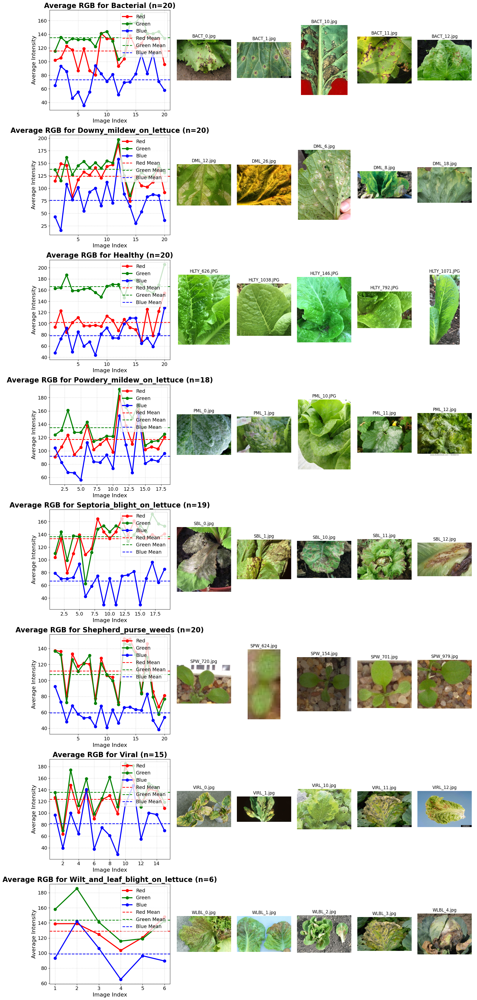

In [40]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


def compute_avg_rgb(images):
    avg_r, avg_g, avg_b = [], [], []
    for img_path in images:
        img = cv2.imread(img_path)
        if img is None:
            continue
        img = cv2.resize(img, (240, 240))
        b, g, r = cv2.split(img)
        avg_r.append(np.mean(r))
        avg_g.append(np.mean(g))
        avg_b.append(np.mean(b))
    return avg_r, avg_g, avg_b


# Path to dataset
dataset_path = r"F:\Lettuce_leaf_classification\Lettuce_disease_datasets"
class_folders = [
    d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))
]
class_folders.sort()

n_classes = len(class_folders)
n_img_display = 5  # Number of images to show per class on the right
fig_height = n_classes * 5  # Fixed height per class row
fig_width = 18  # Fixed width for all
fig, axes = plt.subplots(
    n_classes,
    2,
    figsize=(fig_width, fig_height),
    gridspec_kw={"width_ratios": [2, n_img_display]},
    squeeze=False,
)

for idx, cls in enumerate(class_folders):
    class_path = os.path.join(dataset_path, cls)
    img_files = [
        os.path.join(class_path, f)
        for f in os.listdir(class_path)
        if os.path.isfile(os.path.join(class_path, f))
    ]
    sample_imgs = img_files if len(img_files) <= 20 else random.sample(img_files, 20)
    r_vals, g_vals, b_vals = compute_avg_rgb(sample_imgs)
    x = list(range(1, len(sample_imgs) + 1))
    ax_rgb = axes[idx, 0]
    # Plot RGB lines
    ax_rgb.plot(
        x, r_vals, color="red", marker="o", linewidth=3, markersize=8, label="Red"
    )
    ax_rgb.plot(
        x, g_vals, color="green", marker="o", linewidth=3, markersize=8, label="Green"
    )
    ax_rgb.plot(
        x, b_vals, color="blue", marker="o", linewidth=3, markersize=8, label="Blue"
    )
    # Plot mean dashed lines
    ax_rgb.axhline(
        np.mean(r_vals), color="red", linestyle="--", linewidth=2, label="Red Mean"
    )
    ax_rgb.axhline(
        np.mean(g_vals), color="green", linestyle="--", linewidth=2, label="Green Mean"
    )
    ax_rgb.axhline(
        np.mean(b_vals), color="blue", linestyle="--", linewidth=2, label="Blue Mean"
    )
    ax_rgb.set_title(
        f"Average RGB for {cls} (n={len(sample_imgs)})", fontsize=20, fontweight="bold"
    )
    ax_rgb.set_xlabel("Image Index", fontsize=16)
    ax_rgb.set_ylabel("Average Intensity", fontsize=16)
    ax_rgb.legend(fontsize=14, loc="upper right")
    ax_rgb.tick_params(axis="both", labelsize=14)
    ax_rgb.grid(True, linestyle="--", alpha=0.5)
    # Show images on the right
    ax_img_grid = axes[idx, 1]
    ax_img_grid.axis("off")
    for j in range(min(n_img_display, len(sample_imgs))):
        img = cv2.imread(sample_imgs[j])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # Place images horizontally within the right subplot using inset axes
        left = j / n_img_display + 0.01
        width = 0.18
        bottom = 0.15
        height = 0.7
        ax_inset = ax_img_grid.inset_axes([left, bottom, width, height])
        ax_inset.imshow(img)
        ax_inset.axis("off")
        ax_inset.set_title(os.path.basename(sample_imgs[j]), fontsize=12)

plt.tight_layout()
plt.show()

### Image Size 640x640

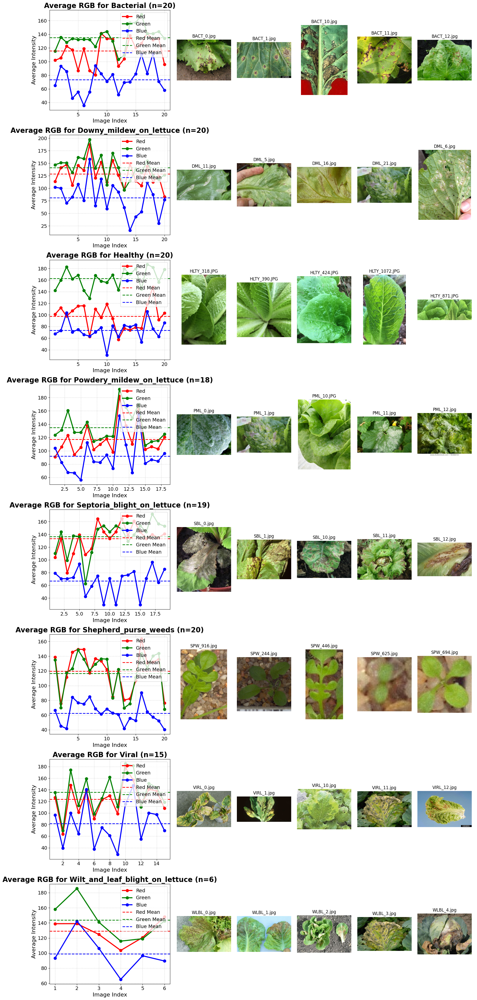

In [41]:
def compute_avg_rgb(images):
    avg_r, avg_g, avg_b = [], [], []
    for img_path in images:
        img = cv2.imread(img_path)
        if img is None:
            continue
        img = cv2.resize(img, (640, 640))
        b, g, r = cv2.split(img)
        avg_r.append(np.mean(r))
        avg_g.append(np.mean(g))
        avg_b.append(np.mean(b))
    return avg_r, avg_g, avg_b


# Path to dataset
dataset_path = r"F:\Lettuce_leaf_classification\Lettuce_disease_datasets"
class_folders = [
    d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))
]
class_folders.sort()

n_classes = len(class_folders)
n_img_display = 5  # Number of images to show per class on the right
fig_height = n_classes * 5  # Fixed height per class row
fig_width = 18  # Fixed width for all
fig, axes = plt.subplots(
    n_classes,
    2,
    figsize=(fig_width, fig_height),
    gridspec_kw={"width_ratios": [2, n_img_display]},
    squeeze=False,
)

for idx, cls in enumerate(class_folders):
    class_path = os.path.join(dataset_path, cls)
    img_files = [
        os.path.join(class_path, f)
        for f in os.listdir(class_path)
        if os.path.isfile(os.path.join(class_path, f))
    ]
    sample_imgs = img_files if len(img_files) <= 20 else random.sample(img_files, 20)
    r_vals, g_vals, b_vals = compute_avg_rgb(sample_imgs)
    x = list(range(1, len(sample_imgs) + 1))
    ax_rgb = axes[idx, 0]
    # Plot RGB lines
    ax_rgb.plot(
        x, r_vals, color="red", marker="o", linewidth=3, markersize=8, label="Red"
    )
    ax_rgb.plot(
        x, g_vals, color="green", marker="o", linewidth=3, markersize=8, label="Green"
    )
    ax_rgb.plot(
        x, b_vals, color="blue", marker="o", linewidth=3, markersize=8, label="Blue"
    )
    # Plot mean dashed lines
    ax_rgb.axhline(
        np.mean(r_vals), color="red", linestyle="--", linewidth=2, label="Red Mean"
    )
    ax_rgb.axhline(
        np.mean(g_vals), color="green", linestyle="--", linewidth=2, label="Green Mean"
    )
    ax_rgb.axhline(
        np.mean(b_vals), color="blue", linestyle="--", linewidth=2, label="Blue Mean"
    )
    ax_rgb.set_title(
        f"Average RGB for {cls} (n={len(sample_imgs)})", fontsize=20, fontweight="bold"
    )
    ax_rgb.set_xlabel("Image Index", fontsize=16)
    ax_rgb.set_ylabel("Average Intensity", fontsize=16)
    ax_rgb.legend(fontsize=14, loc="upper right")
    ax_rgb.tick_params(axis="both", labelsize=14)
    ax_rgb.grid(True, linestyle="--", alpha=0.5)
    # Show images on the right
    ax_img_grid = axes[idx, 1]
    ax_img_grid.axis("off")
    for j in range(min(n_img_display, len(sample_imgs))):
        img = cv2.imread(sample_imgs[j])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # Place images horizontally within the right subplot using inset axes
        left = j / n_img_display + 0.01
        width = 0.18
        bottom = 0.15
        height = 0.7
        ax_inset = ax_img_grid.inset_axes([left, bottom, width, height])
        ax_inset.imshow(img)
        ax_inset.axis("off")
        ax_inset.set_title(os.path.basename(sample_imgs[j]), fontsize=12)

plt.tight_layout()
plt.show()

### We know that 2D images are made of pixels . These pixels have many format such as RGB, HSV etc .

In Machine vision or Computer Vision tasks , the 3 channel RGB Matrices gives a lot of insightful idea aboout the dataset.

In the previous section "00_data_visualization.ipnb" , we have seen that the images belongs to 8 different classes , having imbalance among the numbers of images as well as their size and resolution.


It becomes extremly important to appropriately resize, orient, augment our data before trying to fit in any classical or Deep Neural Network for Machine Learing operation.

    # here , above we have resized the Random Images (from each folder) by (224x224) and (640x640) pixels having 3 channels RGB.
    # We observe that the overall mean values for different classes remains almost similar even after resizing .
        Observance :
            1: Green Channel mean dominates all other classes's channel .(Except : SPW).
                In case of only SPW , mean of Red channel is more than the mean of Green .
            2: For both the cases, i.e (224x224) and (640x640)------- SBL and SPW ------> The mean for Red and Green Channel are very close to each other.

            Hence , Resizing is not helping a lot in RGB feature extraction.
            But, resizing will play very important role , while fitting the model.



### For Our purpose we will experiment with 2 resizing images 
    # 640 x 640 , as it is very close to the median of all the image size. (But there are plenty of images , whose resolution is far smalleer than 640x640).In that case , resizing the smaller images to 640x640 , will lead to noise and bad quality of images.

    # For smaller images we will also experiment with 224x224

In [42]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mahotas
from glob import glob
from sklearn.preprocessing import StandardScaler

In [43]:
data_dir = "F:\Lettuce_leaf_classification\Lettuce_disease_datasets"
classes = sorted(os.listdir(data_dir))
class_images = {cls: glob(os.path.join(data_dir, cls, "*.jpg")) for cls in classes}
print(classes)

['Bacterial', 'Downy_mildew_on_lettuce', 'Healthy', 'Powdery_mildew_on_lettuce', 'Septoria_blight_on_lettuce', 'Shepherd_purse_weeds', 'Viral', 'Wilt_and_leaf_blight_on_lettuce']


In [44]:
import os
import random
import cv2
import matplotlib.pyplot as plt


def resized_gray_scale_images(data_dir, num_images_per_class=5, img_size=(240, 240)):
    """
    Selects `num_images_per_class` random images from each class folder, resizes them to img_size,
    converts to grayscale, and visualizes them.

    Args:
        data_dir (str): Root directory containing class subfolders with images.
        num_images_per_class (int): Number of random images to select per class.
        img_size (tuple): Target image size (width, height).
    """
    class_folders = [
        os.path.join(data_dir, folder)
        for folder in os.listdir(data_dir)
        if os.path.isdir(os.path.join(data_dir, folder))
    ]

    fig, axes = plt.subplots(
        len(class_folders), num_images_per_class, figsize=(15, 2.5 * len(class_folders))
    )
    fig.suptitle(
        "Random Grayscale Images - 5  Images from Each Class\n(Resized to 240x240)",
        fontsize=16,
    )

    for class_idx, class_path in enumerate(class_folders):
        class_name = os.path.basename(class_path)
        image_files = [
            file
            for file in os.listdir(class_path)
            if file.lower().endswith((".png", ".jpg", ".jpeg"))
        ]

        selected_images = random.sample(
            image_files, min(num_images_per_class, len(image_files))
        )

        for img_idx, img_file in enumerate(selected_images):
            img_path = os.path.join(class_path, img_file)
            img = cv2.imread(img_path)
            img_resized = cv2.resize(img, img_size)
            img_gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

            ax = axes[class_idx, img_idx] if len(class_folders) > 1 else axes[img_idx]
            ax.imshow(img_gray, cmap="gray")
            ax.set_title(f"{class_name}", fontsize=10)
            ax.axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

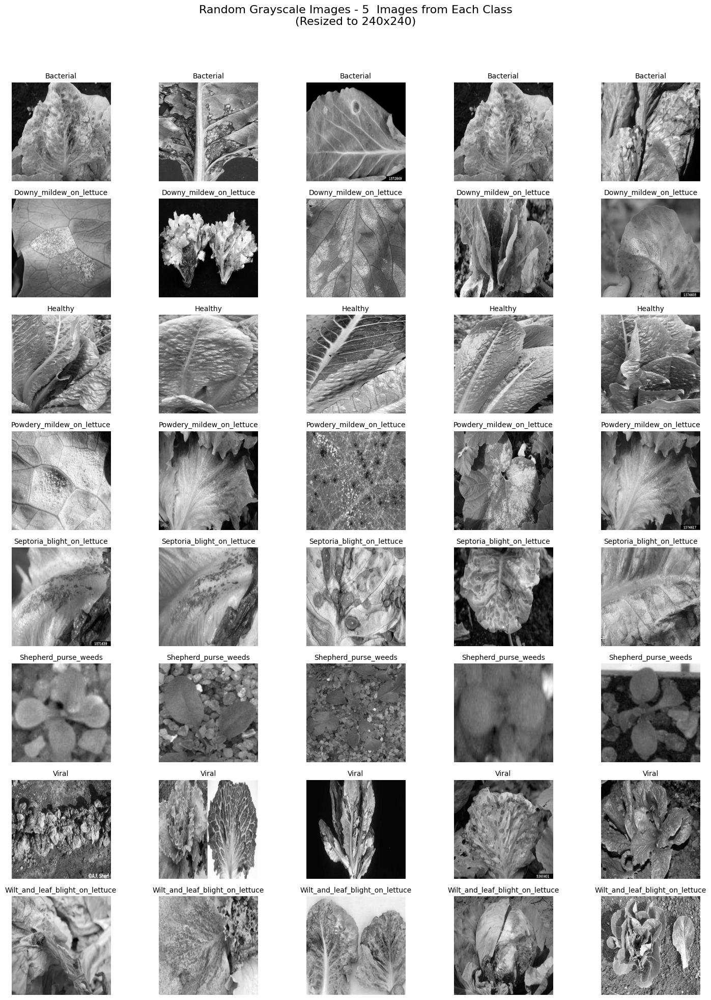

In [45]:
resized_gray_scale_images(data_dir=data_dir)

In [46]:
def compute_brightness(img_path):
    img = cv2.imread(img_path)
    if img is None:
        return 0
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return np.mean(gray)


def extract_texture(img_path):
    img = cv2.imread(img_path)
    if img is None:
        return np.zeros(13)
    gray = cv2.cvtColor(cv2.resize(img, (240, 240)), cv2.COLOR_BGR2GRAY)
    return mahotas.features.haralick(gray).mean(axis=0)


def extract_histogram(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(cv2.resize(img, (240, 240)), cv2.COLOR_BGR2GRAY)
    hist = cv2.calcHist([gray], [0], None, [64], [0, 256])
    return hist.flatten() / hist.sum()

These are 13 Haralick texture features, extracted using mahotas.features.haralick().

🔗 Official reference: Mahotas Haralick Features Documentation

These features are statistical metrics derived from the gray-level co-occurrence matrix (GLCM) — they describe how pixel intensities are spatially distributed.

Feature Name	texture_#	Description
Angular Second Moment (ASM)	0	Measures uniformity. Higher means less texture.
Contrast	1	Measures local variations. Higher means more texture.
Correlation	2	Pixel correlation
Sum of Squares	3	Image variance
Inverse Difference Moment	4	Texture homogeneity
Sum Average	5	Average sum of intensity
Sum Variance	6	Variance of the sum
Sum Entropy	7	Disorder of the image
Entropy	8	Randomness or complexity
Difference Variance	9	Intensity difference variance
Difference Entropy	10	Difference in randomness
Info Measure Corr 1	11	Info theory correlation
Info Measure Corr 2	12	Alternate info correlation

These are computed in 4 directions (0°, 45°, 90°, 135°) and then averaged — that's why mean(axis=0) is taken.

✅ hist_0 to hist_63
These are grayscale histogram bin values, i.e., frequencies of pixel intensities in a given range.

Since the histogram is divided into 64 bins:

Each bin represents intensity values in range of 4:

hist_0 → 0–3

hist_1 → 4–7
...

hist_63 → 252–255

These bins represent how many pixels lie in each brightness range.

🔗 Related: OpenCV Histogram Calculation

In [47]:
import pandas as pd

data = []

for label, cls in enumerate(classes):
    for path in class_images[cls][:]:  # Limit to 50 per class to speed up
        brightness = compute_brightness(path)
        texture = extract_texture(path)
        histogram = extract_histogram(path)

        row = {
            "class": cls,
            "brightness": brightness,
        }
        for i, t in enumerate(texture):
            row[f"texture_{i}"] = t
        for i, h in enumerate(histogram):
            row[f"hist_{i}"] = h
        data.append(row)

df = pd.DataFrame(data)

In [49]:
df

,class,brightness,texture_0,texture_1,texture_2,texture_3,texture_4,texture_5,texture_6,texture_7,...,hist_54,hist_55,hist_56,hist_57,hist_58,hist_59,hist_60,hist_61,hist_62,hist_63
0,Bacterial,105.681213,0.000213,179.414974,0.961457,2327.073882,0.162140,211.321734,9128.880553,8.542587,...,0.002378,0.002118,0.001198,0.001111,0.000486,0.000278,0.000069,0.000017,0.000000,0.000000
1,Bacterial,121.675126,0.000291,248.781522,0.852087,841.118487,0.123878,243.199118,3115.692426,7.782465,...,0.000260,0.000208,0.000295,0.000312,0.000226,0.000035,0.000052,0.000069,0.000035,0.000000
2,Bacterial,121.750298,0.000424,599.545049,0.892747,2795.011877,0.130888,243.401063,10580.502458,8.468325,...,0.008003,0.006944,0.006858,0.007014,0.007865,0.007292,0.005226,0.001128,0.000035,0.000000
3,Bacterial,118.741499,0.000262,250.616348,0.954806,2772.998259,0.160693,237.585471,10841.376687,8.514438,...,0.003212,0.002795,0.001458,0.001233,0.000382,0.000000,0.000000,0.000000,0.000000,0.000000
4,Bacterial,109.830653,0.000250,219.855194,0.958645,2659.035096,0.149557,219.799164,10416.285189,8.354088,...,0.000451,0.000122,0.000017,0.000017,0.000017,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2331,Wilt_and_leaf_blight_on_lettuce,166.770217,0.000621,156.658062,0.933748,1182.583283,0.187464,332.960638,4573.675071,7.868704,...,0.019028,0.037569,0.070903,0.015069,0.002917,0.000295,0.000000,0.000000,0.000000,0.000000
2332,Wilt_and_leaf_blight_on_lettuce,132.280965,0.000064,1507.491823,0.699353,2506.946658,0.056930,264.344727,8520.294811,8.541330,...,0.007847,0.007257,0.006042,0.005538,0.004826,0.005035,0.004948,0.004826,0.003646,0.003108
2333,Wilt_and_leaf_blight_on_lettuce,106.502474,0.000299,218.027938,0.946128,2023.477121,0.159047,212.969079,7875.880546,8.372412,...,0.000417,0.000104,0.000035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2334,Wilt_and_leaf_blight_on_lettuce,117.043343,0.000190,334.183893,0.930713,2411.553961,0.146010,234.187433,9312.031950,8.528022,...,0.002153,0.001875,0.001944,0.001806,0.001111,0.000399,0.000122,0.000000,0.000017,0.000017


In [50]:
df.columns

Index(['class', 'brightness', 'texture_0', 'texture_1', 'texture_2',
       'texture_3', 'texture_4', 'texture_5', 'texture_6', 'texture_7',
       'texture_8', 'texture_9', 'texture_10', 'texture_11', 'texture_12',
       'hist_0', 'hist_1', 'hist_2', 'hist_3', 'hist_4', 'hist_5', 'hist_6',
       'hist_7', 'hist_8', 'hist_9', 'hist_10', 'hist_11', 'hist_12',
       'hist_13', 'hist_14', 'hist_15', 'hist_16', 'hist_17', 'hist_18',
       'hist_19', 'hist_20', 'hist_21', 'hist_22', 'hist_23', 'hist_24',
       'hist_25', 'hist_26', 'hist_27', 'hist_28', 'hist_29', 'hist_30',
       'hist_31', 'hist_32', 'hist_33', 'hist_34', 'hist_35', 'hist_36',
       'hist_37', 'hist_38', 'hist_39', 'hist_40', 'hist_41', 'hist_42',
       'hist_43', 'hist_44', 'hist_45', 'hist_46', 'hist_47', 'hist_48',
       'hist_49', 'hist_50', 'hist_51', 'hist_52', 'hist_53', 'hist_54',
       'hist_55', 'hist_56', 'hist_57', 'hist_58', 'hist_59', 'hist_60',
       'hist_61', 'hist_62', 'hist_63'],
      dtype=

### Lets Visualize the Distribution of Brightness across distinct classes :
    # This will help us understand , 
        What is the distribution of brightness in GrayScale when mapped from RGB.
        Comparision for Distribution of brightness across different classes. 

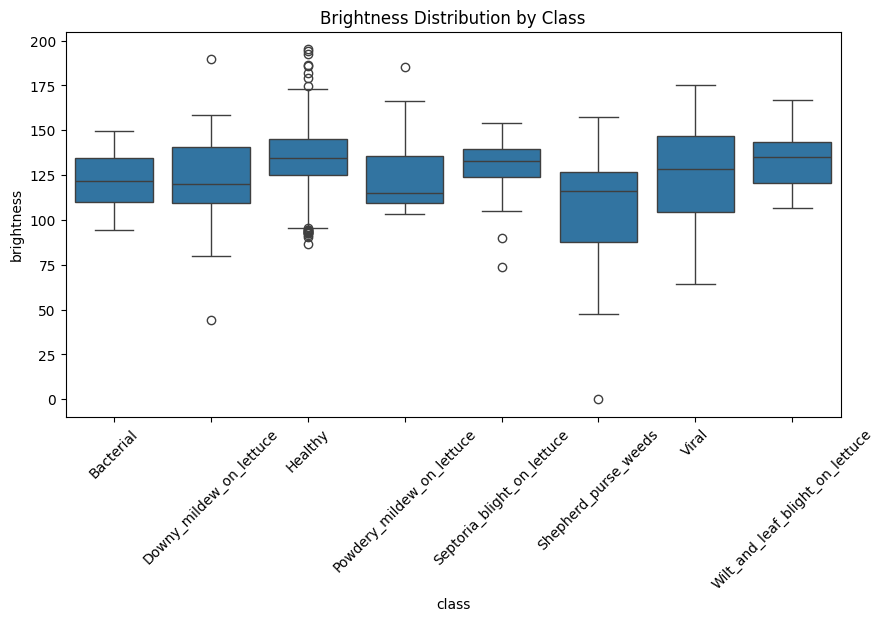

In [51]:
plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x="class", y="brightness")
plt.title("Brightness Distribution by Class")
plt.xticks(rotation=45)
plt.show()

C:\Users\amans\AppData\Local\Temp\ipykernel_25560\2228294921.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x="class", y="brightness", palette="tab10")


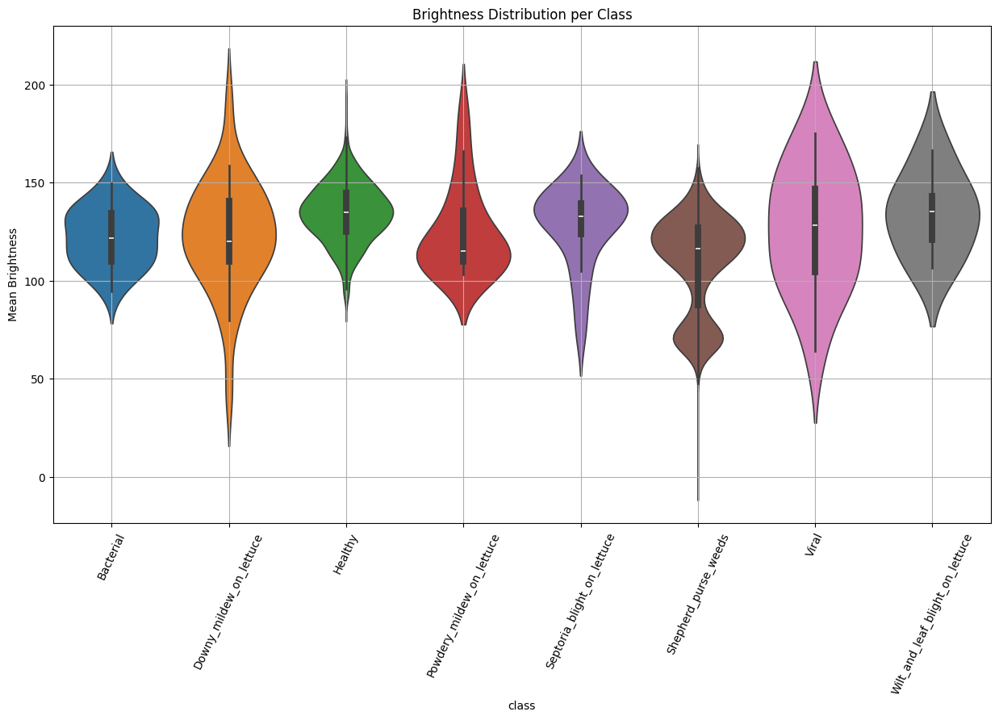

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 8))
sns.violinplot(data=df, x="class", y="brightness", palette="tab10")
plt.title("Brightness Distribution per Class")
plt.xticks(rotation=65)
plt.ylabel("Mean Brightness")
plt.grid(True)
plt.show()

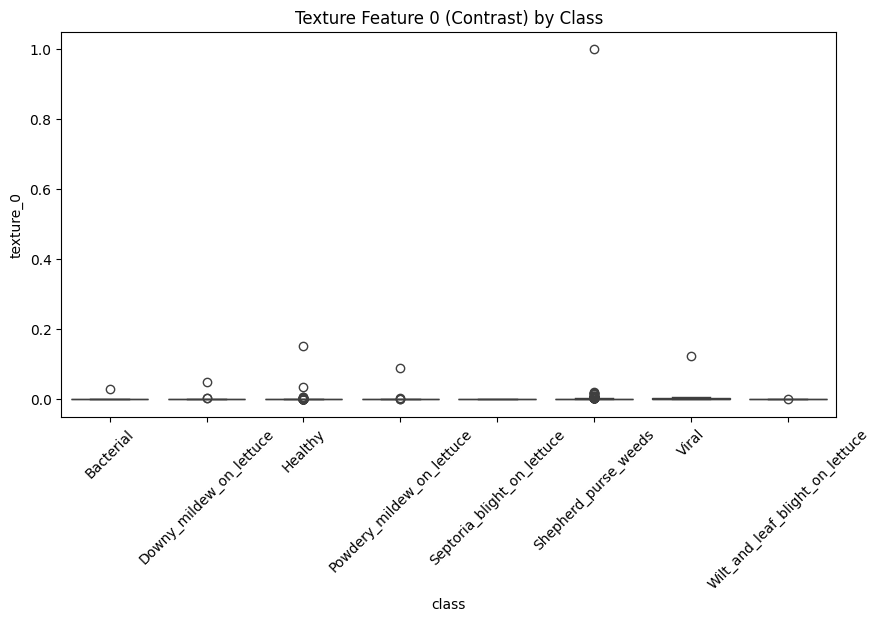

In [55]:
plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x="class", y="texture_0")
plt.title("Texture Feature 0 (Contrast) by Class")
plt.xticks(rotation=45)
plt.show()

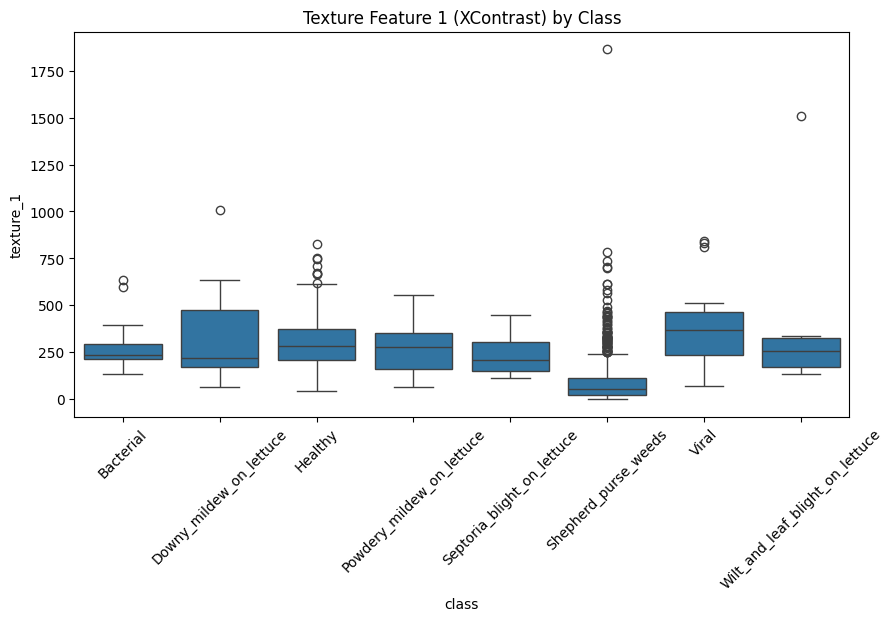

In [56]:
plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x="class", y="texture_1")
plt.title("Texture Feature 1 (XContrast) by Class")
plt.xticks(rotation=45)
plt.show()

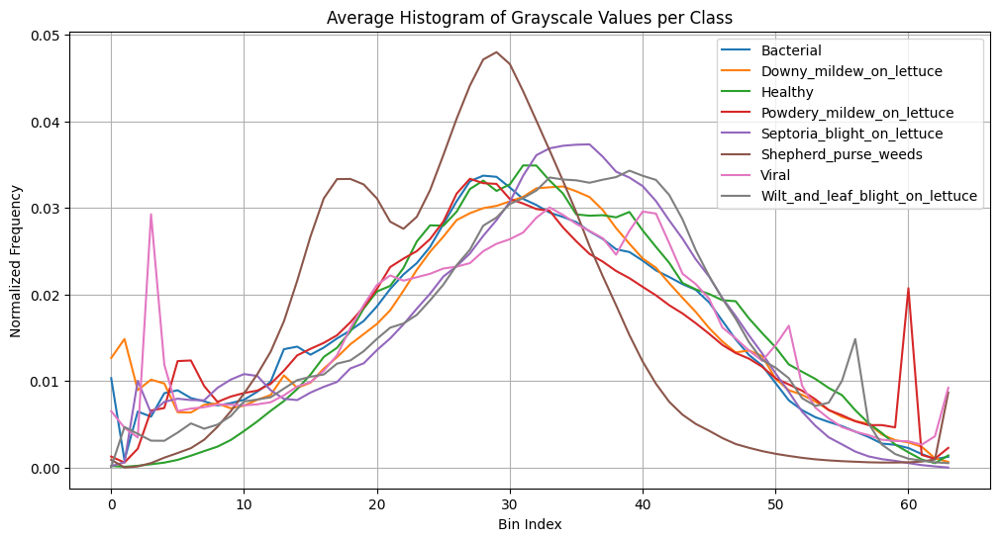

In [ ]:
plt.figure(figsize=(12, 6))

for cls in classes:
    subset = df[df["class"] == cls]
    avg_hist = subset[[f"hist_{i}" for i in range(64)]].mean().values
    plt.plot(avg_hist, label=cls)


plt.legend()
plt.title("Average Histogram of Grayscale Values per Class")
plt.xlabel("Bin Index")
plt.ylabel("Normalized Frequency")
plt.grid(True)
plt.show()

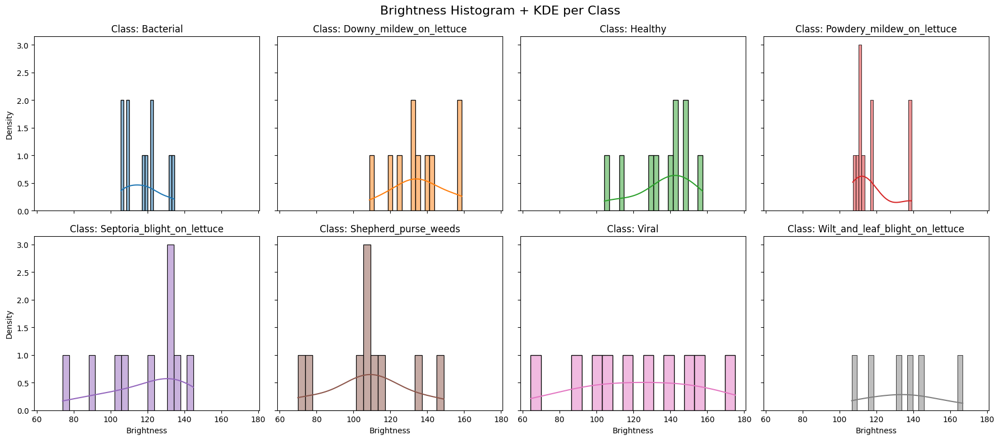

In [25]:
fig, axes = plt.subplots(2, 4, figsize=(18, 8), sharex=True, sharey=True)
axes = axes.flatten()

for i, cls in enumerate(df["class"].unique()):
    sns.histplot(
        data=df[df["class"] == cls],
        x="brightness",
        bins=20,
        kde=True,
        ax=axes[i],
        color=sns.color_palette("tab10")[i],
        edgecolor="black",
    )
    axes[i].set_title(f"Class: {cls}")
    axes[i].set_xlabel("Brightness")
    axes[i].set_ylabel("Density")

plt.suptitle("Brightness Histogram + KDE per Class", fontsize=16)
plt.tight_layout()
plt.show()

In [66]:
import os
import pandas as pd
import SimpleITK as sitk
from radiomics import featureextractor
from tqdm import tqdm


def extract_radiomics_features(image_dir, mask_dir=None, params_path=None):
    """
    Extracts PyRadiomics features for each image in a directory.

    Args:
        image_dir (str): Path to image folder.
        mask_dir (str): Path to masks folder (optional).
        params_path (str): YAML config for PyRadiomics (optional).

    Returns:
        pd.DataFrame: DataFrame of features indexed by image filename.
    """
    # Initialize extractor
    if params_path:
        extractor = featureextractor.RadiomicsFeatureExtractor(params_path)
    else:
        extractor = featureextractor.RadiomicsFeatureExtractor()

    feature_rows = []

    for filename in tqdm(os.listdir(image_dir)):
        if not filename.endswith(".png"):
            continue

        img_path = os.path.join(image_dir, filename)
        image = sitk.ReadImage(img_path)

        if mask_dir:
            mask_path = os.path.join(mask_dir, filename.replace(".png", "_mask.png"))
            if not os.path.exists(mask_path):
                print(f"Mask missing for {filename}")
                continue
            mask = sitk.ReadImage(mask_path)
        else:
            # If no mask provided, create one (full image considered as ROI)
            mask = sitk.Image(image.GetSize(), sitk.sitkUInt8)
            mask.CopyInformation(image)
            mask = sitk.BinaryThreshold(
                image,
                lowerThreshold=1,
                upperThreshold=255,
                insideValue=1,
                outsideValue=0,
            )

        # Extract features
        try:
            features = extractor.execute(image, mask)
            features_cleaned = {
                k: v for k, v in features.items() if "diagnostics" not in k
            }
            features_cleaned["image_name"] = filename
            feature_rows.append(features_cleaned)
        except Exception as e:
            print(f"Error extracting features for {filename}: {e}")

    # Create DataFrame
    feature_df = pd.DataFrame(feature_rows)
    feature_df.set_index("image_name", inplace=True)

    return feature_df


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "C:\Users\amans\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "C:\Users\amans\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "f:\Lettuce_leaf_classification\Lettuce_leaf_classification\leaf_classf\lib\site-packages\ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "f:\Lettuce_leaf_classification\Lettuce_leaf_classification\lea

ImportError: 
A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.



Error loading C extensions
Traceback (most recent call last):
  File "f:\Lettuce_leaf_classification\Lettuce_leaf_classification\leaf_classf\lib\site-packages\radiomics\__init__.py", line 286, in <module>
    from radiomics import _cmatrices as cMatrices  # noqa: F401
ImportError: numpy.core.multiarray failed to import
Error loading C extensions
Traceback (most recent call last):
  File "f:\Lettuce_leaf_classification\Lettuce_leaf_classification\leaf_classf\lib\site-packages\radiomics\__init__.py", line 286, in <module>
    from radiomics import _cmatrices as cMatrices  # noqa: F401
ImportError: numpy.core.multiarray failed to import


ImportError: numpy.core.multiarray failed to import

In [64]:
!pip install pyradiomics


  Using cached pyradiomics-3.1.0.tar.gz (34.5 MB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Using cached pyradiomics-3.0.1-cp310-cp310-win_amd64.whl
  Using cached pywavelets-1.8.0-cp310-cp310-win_amd64.whl (4.2 MB)
  Using cached pykwalify-1.8.0-py2.py3-none-any.whl (24 kB)
  Using cached ruamel.yaml-0.18.14-py3-none-any.whl (118 kB)
  Using cached docopt-0.6.2-py2.py3-none-any.whl
  Using cached ruamel.yaml.clib-0.2.12-cp310-cp310-win_amd64.whl (118 kB)


You should consider upgrading via the 'F:\Lettuce_leaf_classification\Lettuce_leaf_classification\leaf_classf\Scripts\python.exe -m pip install --upgrade pip' command.


In [ ]:
!pip install numpy pandas matplotlib seaborn opencv-python mahotas tqdm SimpleITK pyradiomics


ModuleNotFoundError: No module named 'variables'